# Poisson equation with FEM

In [3]:
%%javascript
MathJax.Hub.Config({
    TeX: { equationNumbers: { autoNumber: "AMS" } }
});

<IPython.core.display.Javascript object>

Poisson equation with Dirichlet boundary condition has a form of:
\begin{equation}
\bigtriangleup u(x, y, z) = -f, \quad \forall (x, y, z) \in \Omega \\
u(x, y, z) = g(x, y, z), \quad \forall (x, y, z) \in \delta \Omega
\end{equation}

To solve it $\Omega$ is divided into tetrahedra: $\Omega = 	\cap_{k = 1}^{k = N_t} T_k$. The triangulation contains $N_p$ points, the set of points is $P$. Also we consider $\Omega$ to be an open set.

Assume, that $u(x, y, z) = \sum_{i = 1}^{i = N_p} u_i \phi_i(x,y,z)$, so we define a new basis of function, all functions should be continuous. The choice of basis functions is generally arbitrary, but for simplicity we choose them as follows:
Let $T_k$ consists from points with number $k_1, k_2, k_3, k_4$, then 

\begin{equation}
\phi_{k_i}(\textbf{x}) =  \Bigg\{\begin{array}{c}
1, \quad if \quad \textbf{x} = P_{k_i},\qquad  \cr
0, \quad if \quad \textbf{x} = P_{k_j}, \forall j \neq i 
\end{array}
\label{phi}
\end{equation}

Further we will talk about how to compute this functions and will show that they are linear, but now let's put these functions in our system.

First, let's multiply the first equation by trial function $v$ and integrate it.

$$
\int_{\Omega} \bigtriangleup u v \mathrm{d} V = \int_{\Omega} -f v \mathrm{d} V
$$

With Green's identity:

$$
\int_{\delta \Omega} \bigtriangledown u v \mathrm{d} S -\int_{\Omega} \bigtriangledown u \bigtriangledown v \mathrm{d} V = \int_{\Omega} -f v \mathrm{d} V
$$

So,
1. $\int_{\delta \Omega} \bigtriangledown u v \mathrm{d} S = \sum_{p_i \in \delta \Omega} \int_{\delta T_k, p_i \in T_k} u_i \bigtriangledown \phi_i v \mathrm{d} S$,  where $ p_i \in T_k$ iff the $i^{th}$ point is the vertex of the $k^{th}$ tetrahedron. 
 
Let's choose $v$ as one of the basis functions: $v = \phi_m$, also let's take into account that these functions are linear, then
\begin{equation}
\sum_{p_i \in \delta \Omega} \int_{\delta  T_k, p_i \in T_k} u_i \bigtriangledown \phi_i v \mathrm{d} S  = \sum_{p_i \in \delta \Omega} \int_{T_k, p_i \in T_k} u_i \bigtriangledown \phi_i \bigtriangledown \phi_m \mathrm{d} V
\end{equation}

2. \begin{equation}\int_{\Omega} \bigtriangledown u \bigtriangledown v \mathrm{d} V = \sum_{p_i \in \Omega} \int_{T_k, p_i \in T_k} u_i \bigtriangledown \phi_i \bigtriangledown \phi_m \mathrm{d} V \end{equation}

3. \begin{equation}\int_{\Omega} -f v \mathrm{d} V = \sum_{p_i \in \Omega} \int_{T_k, p_i \in T_k} -f_i  \phi_i \phi_m \mathrm{d} V \end{equation}

The function $\phi_i$ equal zero outside tetrahedrons which contain $p_i$. Thus, in all sums of the integrals above most of the sums will be zero.

### Define of the basis functions

(From https://hal.inria.fr/hal-00656481)

To satisfy the condition above (2), let's work for $T_k$ with points $p_1, p_2, p_3, p_4$, 
$$
\phi_i(x,y,z) = a_i + b_i x + c_i y + d_i z
$$

For example, for $i = 1$ we need to solve next system:
$$\begin{array}{l}{a_{1}+b_{1} x_{1}+c_{1} y_{1}+d_{1} z_{1}=1} \\ {a_{1}+b_{1} x_{2}+c_{1} y_{2}+d_{1} z_{2}=0} \\ {a_{1}+b_{1} x_{3}+c_{1} y_{3}+d_{1} z_{3}=0} \\ {a_{1}+b_{1} x_{4}+c_{1} y_{4}+d_{1} z_{4}=0}\end{array}$$

So,

$$
\left[\begin{array}{llll}{1} & {x_{1}} & {y_{1}} & {z_{1}} \\ {1} & {x_{2}} & {y_{2}} & {z_{2}} \\ {1} & {x_{3}} & {y_{3}} & {z_{3}} \\ {1} & {x_{4}} & {y_{4}} & {z_{4}}\end{array}\right]
\left[\begin{array}{llll}{a_{1}} & {a_{2}} & {a_{3}} & {a_{4}} \\ {b_{1}} & {b_{2}} & {b_{3}} & {b_{4}} \\ {c_{1}} & {c_{2}} & {c_{3}} & {c_{4}} \\ {d_{1}} & {d_{2}} & {d_{3}} & {d_{4}} \end{array}\right] = 
\left[\begin{array}{llll}{1} & {0} & {0} & {0} \\{0} & {1} & {0} & {0} \\{0} & {0} & {1} & {0} \\{0} & {0} & {0} & {1}  \end{array}\right]
$$

where 
$$
A_k = \left[\begin{array}{llll}{a_{1}} & {a_{2}} & {a_{3}} & {a_{4}} \\ {b_{1}} & {b_{2}} & {b_{3}} & {b_{4}} \\ {c_{1}} & {c_{2}} & {c_{3}} & {c_{4}} \\ {d_{1}} & {d_{2}} & {d_{3}} & {d_{4}} \end{array}\right]
$$
is inverse of 
$$
B_k = \left[\begin{array}{llll}{1} & {x_{1}} & {y_{1}} & {z_{1}} \\ {1} & {x_{2}} & {y_{2}} & {z_{2}} \\ {1} & {x_{3}} & {y_{3}} & {z_{3}} \\ {1} & {x_{4}} & {y_{4}} & {z_{4}}\end{array}\right],
$$
then $\bigtriangledown \phi_i = [b_i, c_i, d_i]^T$.

Also, a volume $V_k$ of the $T_k$ is $$
V_k  = \frac{1}{6} |B|
$$

### The integrals 

###### Let's start from (4):

Let $K$ to denote a matrix (it is called stiffness matrix), where 

$$
K_{ij} = \int_{\Omega} \bigtriangledown \phi_i \bigtriangledown \phi_j \mathrm{d} V,
$$
then (4) equals 
$$
K \textbf{u},
$$ where $\textbf{u} = (u_1, u_2, ..., u_{N_p})$, note that it is important to calculate $K$ for the gradients only  inside the set.

###### For (3), we will have 
$$
K \textbf{g},
$$  where $\textbf{g} = (g_1, g_2, ..., g_{N_p})$, where 
$g_i = \Bigg\{\begin{array}{c}
g(p_i), \quad if \quad p_i \in \delta \Omega,  \cr
0, \quad else
\end{array}
$

###### For (5):

We will calculate $\int_{\Omega} -f \phi_j \mathrm{d} V$ simple as $\int_{\Omega} -f_k \phi_j \mathrm{d} V$ for $p_k$. So, $\int_{\Omega} -f_k \phi_j \mathrm{d} V = -f_k \sum_{T_r} \int_{T_r} \phi_j \mathrm{d} V = -f_k \sum_{T_r} V_{r}/4 = \textbf{F}_k $

###### Finally,

we have the system:
$$
K\textbf{u} = \textbf{F} - K\textbf{g},
$$ with this system we will find $u$ inside the set, after that we need to complement $u$ with values from the surface ($g$)

In the code:
   * $N_t = \verb+tetras_num+$
   * $N_p = \verb+point_num+$
   * $A_k$ is calculated in $\verb+tetra_inv+$ function
   * $V_k$ is calculated in $\verb+volume+$ function
   
   

In [1]:
import meshio
import numpy as np
from scipy import linalg, sparse
from scipy.sparse.linalg import cg,spsolve
from tqdm import tqdm_notebook
from matplotlib import pyplot as plt

In [2]:
class Point:
    x = 0
    y = 0
    z = 0
    def __init__(self, arr):
        self.x = arr[0]
        self.y = arr[1] 
        self.z = arr[2]
        
    def print(self):
        print(self.x, self.y, self.z)
    
    def array(self):
        return [self.x, self.y, self.z]
    
    def get_all(self):
        return self.x, self.y, self.z

In [214]:
def tetra_inv(x1, x2, x3, x4):
    '''
    :params: Four vertices of tetrahedra
    :return: Inverse matrix of vertices
    '''
    return np.linalg.inv(np.array([
        [1, x1.x, x1.y, x1.z],
        [1, x2.x, x2.y, x2.z],
        [1, x3.x, x3.y, x3.z],
        [1, x4.x, x4.y, x4.z]
    ]))

def volume(x1, x2, x3, x4):
    '''
    Calculate the volume of the tetrahedra
    :params:  Four vertices of tetrahedra
    :return: volume of a tetrahedra by points
    '''
    return np.abs(np.linalg.det(np.array([
        [1, x1.x, x1.y, x1.z],
        [1, x2.x, x2.y, x2.z],
        [1, x3.x, x3.y, x3.z],
        [1, x4.x, x4.y, x4.z]
    ]))/6)

For equation:
$$
\bigtriangleup u = - 12 \pi^2 \sin (2 \pi (x+y+z)), \quad in \quad \Omega \\
u = \sin (2 \pi (x+y+z)), \quad in \quad \delta \Omega
$$

Solution is $u = \sin (2 \pi (x+y+z))$


In [320]:
def u_real(x, y, z):
    '''
    Return real solution by points
    :param x, y, z: points
    :return: real solution for the poisson equation
    '''
#     return x**3+y**3+z**3
    return np.sin(2*np.pi*(x+y+z))
#     return np.sin(2*np.pi*x*y) + np.sin(2*np.pi*x*z) +np.sin(2*np.pi*z*y)


def f(x, y, z):
    '''
    Return f from the  poisson equation
    :param x, y, z: points
    :return: f from the poisson equation
    '''
    return 0
#     return 12*np.pi**2*np.sin(2*np.pi*(x+y+z))
#     return 4*np.pi**2*((x**2 + y**2)*np.sin(2*np.pi*x*y) + (x**2 + z**2)*np.sin(2*np.pi*x*z) + (z**2 + y**2)*np.sin(2*np.pi*z*y))


def bounds(x, y, z):
    '''
    g function from the  poisson equation
    :param x, y, z: points
    :return: boundary condition function
    '''
    if on_surface(x, y, z):
        return u_real(x, y, z)
    else:
        return 0


def on_surface(x, y, z, eps=1e-15):
    '''
    Check if point is on the surfcae with accuracy of eps
    Uncomment right return for your case
    :param x, y, z: points
    :param eps: Accuracy of decision
    :return: True if on the surface, False else
    '''
#     return np.abs(x**2 + y**2 + z**2 - 1) < eps #for sphere
    return (x < eps) or (y < eps) or (z < eps) or (1 - x < eps) or (
        1 - y < eps) or (1 - z < eps) #for box

In [321]:
# Read our mesh, get points and tethras
mesh_files = ['mesh/1split.vtk', 'mesh/2split.vtk', 'mesh/3split.vtk', 'mesh/square.vtk', 'mesh/square2.vtk', 'mesh/cube20.vtk','mesh/cube.vtk','mesh/small_cube.vtk']
mesh = meshio.read(mesh_files[-3])


points = mesh.points
tetras = mesh.cells['tetra']

point_num = len(points) 
tetras_num = len(tetras)

points = [Point(i) for i in points]

In [322]:
# check how much points are on the surface and inside it
on_sh = 0
inside_sp = 0
for p in points:
    if on_surface(*p.array()):
        on_sh += 1
    else:
        inside_sp += 1
print('on the surface: ', on_sh/point_num)
print('inside the surface: ', inside_sp/point_num)

on the surface:  0.142625
inside the surface:  0.857375


In [323]:
# calculate the gradients of the basis functions
gradients = []
for t in tqdm_notebook(range(tetras_num)):
    tetra = tetras[t]
    gradients.append(tetra_inv(points[tetra[0]], 
                               points[tetra[1]], 
                               points[tetra[2]], 
                               points[tetra[3]])[1:, :].T)

In [324]:
# caclulate the stiffness matrix K
K = np.zeros((point_num, point_num))
for t in tqdm_notebook(range(tetras_num)):
    tetra = tetras[t]
    gr = gradients[t]
    v = volume(points[tetra[0]], points[tetra[1]], points[tetra[2]], points[tetra[3]])
    for i in range(4):
        for j in range(4):
            scalar_product = np.dot(gr[i], gr[j])
            if not on_surface(*points[tetra[i]].array()):
                K[tetra[i]][tetra[j]] += scalar_product * v

In [ ]:
#Let's look on K
plt.spy(K)
# we will see emptiness for first rows - these rows denote points on the surface

In [325]:
# calculate g vector
G = np.zeros(point_num)
for p in tqdm_notebook(range(point_num)):
    if on_surface(*points[p].array()):
        G[p] = bounds(*points[p].array())

In [326]:
# calculate F vector
F = np.zeros(point_num)
for t, tetra in tqdm_notebook(enumerate(tetras)):
    for i in range(4):
        if not on_surface(*points[tetra[i]].array()):
            v = volume(points[tetra[0]], points[tetra[1]], points[tetra[2]], points[tetra[3]])
            F[tetra[i]] += f(*points[tetra[i]].array())*v/4

In [327]:
# calculate new F and solve the system Ku = F
F_updated = F - K.dot(G)


In [328]:
u_saved = []
def save_callback(x):
    u_saved.append(x)
u_my = sparse.linalg.cg(K, F_updated, maxiter=300, callback=save_callback)
# u_my = u_my
u_my

(array([0., 0., 0., ..., 0., 0., 0.]), 0)

In [296]:
u_my[0].mean()
#0.031359859548816954



7.289998028654743

In [329]:
xes = np.array([p.x for p in points])
yes = np.array([p.y for p in points])
zes = np.array([p.z for p in points])
# real solution vector
u_real_array = [u_real(x,y,z) for x,y,z in zip(xes, yes, zes)]

# put boundary condition for my solution vector 
for i in range(len(xes)):
    if on_surface(xes[i], yes[i], zes[i]):
        u_my[0][i] = bounds(xes[i], yes[i], zes[i])

Text(0.5, 0, 'point num')

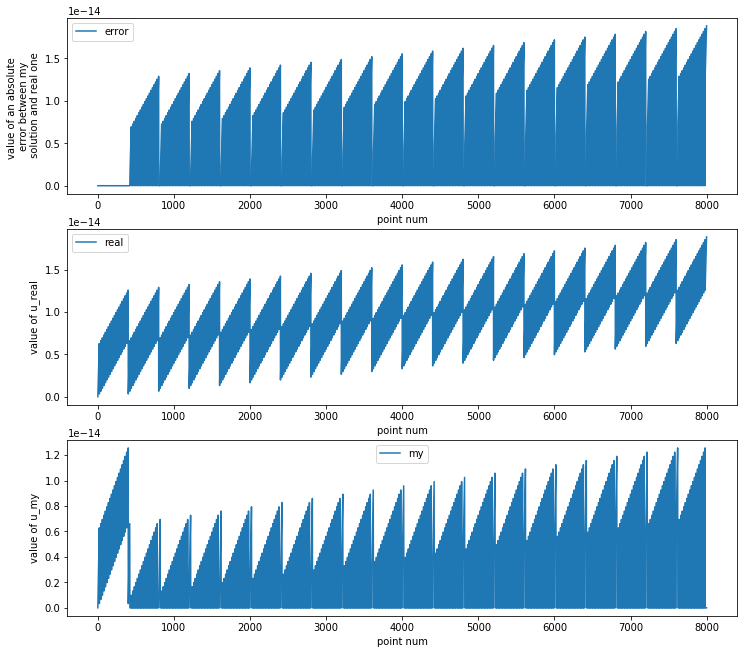

In [330]:
%matplotlib inline
fig, (ax1, ax2, ax3) = plt.subplots(3)
fig.set_size_inches(12, 11)
ax1.plot(np.abs(u_my[0] - u_real_array), label='error')
ax1.legend()
ax1.set_ylabel('value of an absolute \n error between my \n solution and real one')
ax1.set_xlabel('point num')
ax2.plot(u_real_array, label='real')
ax2.legend()
ax2.set_ylabel('value of u_real')
ax2.set_xlabel('point num')
ax3.plot(u_my[0], label='my')
ax3.legend()
ax3.set_ylabel('value of u_my')
ax3.set_xlabel('point num')

In [146]:
def solution_by_mesh(mesh_file):
    mesh = meshio.read(mesh_file)

    points = mesh.points
    tetras = mesh.cells['tetra']

    point_num = len(points) 
    tetras_num = len(tetras)

    points = [Point(i) for i in points]
    
    # calculate the gradients of the basis functions
    gradients = []
    for t in tqdm_notebook(range(tetras_num)):
        tetra = tetras[t]
        gradients.append(tetra_inv(points[tetra[0]], 
                                   points[tetra[1]], 
                                   points[tetra[2]], 
                                   points[tetra[3]])[1:, :].T)
        
    # caclulate the stiffness matrix K
    K = np.zeros((point_num, point_num))
    for t in tqdm_notebook(range(tetras_num)):
        tetra = tetras[t]
        gr = gradients[t]
        v = volume(points[tetra[0]], points[tetra[1]], points[tetra[2]], points[tetra[3]])
        for i in range(4):
            for j in range(4):
                scalar_product = np.dot(gr[i], gr[j])
                if not on_surface(*points[tetra[i]].array()):
                    K[tetra[i]][tetra[j]] += scalar_product * v
    # calculate g vector
    G = np.zeros(point_num)
    for p in tqdm_notebook(range(point_num)):
        if on_surface(*points[p].array()):
            G[p] = bounds(*points[p].array())
            
    # calculate F vector
    F = np.zeros(point_num)
    for t, tetra in tqdm_notebook(enumerate(tetras)):
        for i in range(4):
            if not on_surface(*points[tetra[i]].array()):
                v = volume(points[tetra[0]], points[tetra[1]], points[tetra[2]], points[tetra[3]])
                F[tetra[i]] += f(*points[tetra[i]].array())*v/4
    F_updated = F - K.dot(G)       
    u_my = cg(K, F_updated, maxiter=300)[0]
    xes = np.array([p.x for p in points])
    yes = np.array([p.y for p in points])
    zes = np.array([p.z for p in points])
    # real solution vector
    u_real_array = [u_real(x,y,z) for x,y,z in zip(xes, yes, zes)]

    # put boundary condition for my solution vector 
    for i in range(len(xes)):
        if on_surface(xes[i], yes[i], zes[i]):
            u_my[i] = bounds(xes[i], yes[i], zes[i])
    return u_my, u_real_array

In [147]:
u_mys = []
u_reals = []
nmax = 30
for i in range(1, nmax):
    print(i)
    ui, uri = solution_by_mesh('mesh/cube{}.vtk'.format(i+1))
    print(ui)
    u_mys.append(ui)
    u_reals.append(uri)
    

1



[ 0.00000000e+00 -2.44929360e-16 -2.44929360e-16 -4.89858720e-16
 -2.44929360e-16 -4.89858720e-16 -4.89858720e-16 -7.34788079e-16]
2



[ 0.00000000e+00  1.22464680e-16 -2.44929360e-16  1.22464680e-16
 -2.44929360e-16  3.67394040e-16 -2.44929360e-16  3.67394040e-16
 -4.89858720e-16  1.22464680e-16 -2.44929360e-16  3.67394040e-16
 -2.44929360e-16  0.00000000e+00 -4.89858720e-16  3.67394040e-16
 -4.89858720e-16  6.12323400e-16 -2.44929360e-16  3.67394040e-16
 -4.89858720e-16  3.67394040e-16 -4.89858720e-16  6.12323400e-16
 -4.89858720e-16  6.12323400e-16 -7.34788079e-16]
3



[ 0.00000000e+00  8.66025404e-01 -8.66025404e-01 -2.44929360e-16
  8.66025404e-01 -8.66025404e-01 -2.44929360e-16  8.66025404e-01
 -8.66025404e-01 -2.44929360e-16  8.66025404e-01 -8.66025404e-01
 -2.44929360e-16  8.66025404e-01 -8.66025404e-01 -4.89858720e-16
  8.66025404e-01 -8.66025404e-01 -2.44929360e-16  8.66025404e-01
 -8.66025404e-01 -6.80409068e-01 -4.98705780e-01 -8.66025404e-01
 -2.44929360e-16 -4.98705780e-01 -3.57200948e+00 -2.26621556e-15
  8.66025404e-01 -8.66025404e-01 -2.26621556e-15  8.66025404e-01
 -8.66025404e-01 -2.44929360e-16  8.66025404e-01 -8.66025404e-01
 -2.44929360e-16 -4.98705780e-01 -3.57200948e+00 -4.89858720e-16
  8.66025404e-01 -3.57200948e+00 -1.35299204e+00  8.66025404e-01
 -8.66025404e-01 -4.89858720e-16  8.66025404e-01 -8.66025404e-01
 -2.44929360e-16  8.66025404e-01 -8.66025404e-01 -4.89858720e-16
  8.66025404e-01 -8.66025404e-01 -4.89858720e-16  8.66025404e-01
 -8.66025404e-01 -4.89858720e-16  8.66025404e-01 -8.66025404e-01
 -4.89858720e-16  8.6602


[ 0.00000000e+00  1.00000000e+00  1.22464680e-16 -1.00000000e+00
 -2.44929360e-16  1.00000000e+00  1.22464680e-16 -1.00000000e+00
 -2.44929360e-16  1.00000000e+00  1.22464680e-16 -1.00000000e+00
 -2.44929360e-16  1.00000000e+00  3.67394040e-16 -1.00000000e+00
 -2.44929360e-16  1.00000000e+00  3.67394040e-16 -1.00000000e+00
 -2.44929360e-16  1.00000000e+00  3.67394040e-16 -1.00000000e+00
 -4.89858720e-16  1.00000000e+00  1.22464680e-16 -1.00000000e+00
 -2.44929360e-16  1.00000000e+00  1.22464680e-16 -1.81183995e+00
  4.42116663e-01  2.13761013e+00  3.67394040e-16 -1.00000000e+00
  4.42116663e-01  2.16346490e+00  2.42515358e-16 -1.00000000e+00
 -2.44929360e-16  2.13761013e+00  2.42515358e-16 -2.13761013e+00
 -4.89858720e-16  1.00000000e+00  3.67394040e-16 -1.00000000e+00
 -4.89858720e-16  1.00000000e+00  1.22464680e-16 -1.00000000e+00
 -2.44929360e-16  1.00000000e+00  3.67394040e-16 -1.00000000e+00
  4.42116663e-01  2.16346490e+00  2.42515358e-16 -1.00000000e+00
 -2.44929360e-16  2.1634


[ 0.00000000e+00  9.51056516e-01  5.87785252e-01 -5.87785252e-01
 -9.51056516e-01 -2.44929360e-16  9.51056516e-01  5.87785252e-01
 -5.87785252e-01 -9.51056516e-01 -2.44929360e-16  9.51056516e-01
  5.87785252e-01 -5.87785252e-01 -9.51056516e-01 -2.44929360e-16
  9.51056516e-01  5.87785252e-01 -5.87785252e-01 -9.51056516e-01
 -2.44929360e-16  9.51056516e-01  5.87785252e-01 -5.87785252e-01
 -9.51056516e-01 -2.44929360e-16  9.51056516e-01  5.87785252e-01
 -5.87785252e-01 -9.51056516e-01 -2.44929360e-16  9.51056516e-01
  5.87785252e-01 -5.87785252e-01 -9.51056516e-01 -4.89858720e-16
  9.51056516e-01  5.87785252e-01 -5.87785252e-01 -9.51056516e-01
 -2.44929360e-16  9.51056516e-01  5.87785252e-01 -8.21404721e-01
 -6.88141714e-01  1.88656340e-02  7.85186083e-01  5.87785252e-01
 -5.87785252e-01 -6.88141714e-01  5.10158439e-02  8.47944199e-01
  9.25846615e-01 -5.87785252e-01 -9.51056516e-01  1.88656340e-02
  8.47944199e-01  9.13649999e-01 -4.85271687e-01 -9.51056516e-01
 -2.44929360e-16  7.8518


[ 0.00000000e+00  8.66025404e-01  8.66025404e-01  1.22464680e-16
 -8.66025404e-01 -8.66025404e-01 -2.44929360e-16  8.66025404e-01
  8.66025404e-01  1.22464680e-16 -8.66025404e-01 -8.66025404e-01
 -1.13310778e-15  8.66025404e-01  8.66025404e-01  1.22464680e-16
 -8.66025404e-01 -8.66025404e-01 -2.44929360e-16  8.66025404e-01
  8.66025404e-01  1.22464680e-16 -8.66025404e-01 -8.66025404e-01
 -2.44929360e-16  8.66025404e-01  8.66025404e-01  3.67394040e-16
 -8.66025404e-01 -8.66025404e-01 -2.44929360e-16  8.66025404e-01
  8.66025404e-01  3.67394040e-16 -8.66025404e-01 -8.66025404e-01
 -1.13310778e-15  8.66025404e-01  8.66025404e-01  3.67394040e-16
 -8.66025404e-01 -8.66025404e-01 -2.44929360e-16  8.66025404e-01
  8.66025404e-01  3.67394040e-16 -8.66025404e-01 -8.66025404e-01
 -4.89858720e-16  8.66025404e-01  8.66025404e-01  1.22464680e-16
 -8.66025404e-01 -8.66025404e-01 -1.13310778e-15  8.66025404e-01
  8.66025404e-01  4.08278692e-03 -7.91732724e-01 -1.10161704e+00
  1.13800642e-01  1.1621


[ 0.00000000e+00  7.81831482e-01  9.74927912e-01  4.33883739e-01
 -4.33883739e-01 -9.74927912e-01 -7.81831482e-01 -2.44929360e-16
  7.81831482e-01  9.74927912e-01  4.33883739e-01 -4.33883739e-01
 -9.74927912e-01 -7.81831482e-01 -2.44929360e-16  7.81831482e-01
  9.74927912e-01  4.33883739e-01 -4.33883739e-01 -9.74927912e-01
 -7.81831482e-01 -1.13310778e-15  7.81831482e-01  9.74927912e-01
  4.33883739e-01 -4.33883739e-01 -9.74927912e-01 -7.81831482e-01
 -2.44929360e-16  7.81831482e-01  9.74927912e-01  4.33883739e-01
 -4.33883739e-01 -9.74927912e-01 -7.81831482e-01 -2.44929360e-16
  7.81831482e-01  9.74927912e-01  4.33883739e-01 -4.33883739e-01
 -9.74927912e-01 -7.81831482e-01 -1.13310778e-15  7.81831482e-01
  9.74927912e-01  4.33883739e-01 -4.33883739e-01 -9.74927912e-01
 -7.81831482e-01 -2.44929360e-16  7.81831482e-01  9.74927912e-01
  4.33883739e-01 -4.33883739e-01 -9.74927912e-01 -7.81831482e-01
 -2.44929360e-16  7.81831482e-01  9.74927912e-01  4.33883739e-01
 -4.33883739e-01 -9.7492


[ 0.00000000e+00  7.07106781e-01  1.00000000e+00  7.07106781e-01
  1.22464680e-16 -7.07106781e-01 -1.00000000e+00 -7.07106781e-01
 -2.44929360e-16  7.07106781e-01  1.00000000e+00  7.07106781e-01
  1.22464680e-16 -7.07106781e-01 -1.00000000e+00 -7.07106781e-01
 -2.44929360e-16  7.07106781e-01  1.00000000e+00  7.07106781e-01
  1.22464680e-16 -7.07106781e-01 -1.00000000e+00 -7.07106781e-01
 -2.44929360e-16  7.07106781e-01  1.00000000e+00  7.07106781e-01
  1.22464680e-16 -7.07106781e-01 -1.00000000e+00 -7.07106781e-01
 -2.44929360e-16  7.07106781e-01  1.00000000e+00  7.07106781e-01
  1.22464680e-16 -7.07106781e-01 -1.00000000e+00 -7.07106781e-01
 -2.44929360e-16  7.07106781e-01  1.00000000e+00  7.07106781e-01
  3.67394040e-16 -7.07106781e-01 -1.00000000e+00 -7.07106781e-01
 -2.44929360e-16  7.07106781e-01  1.00000000e+00  7.07106781e-01
  3.67394040e-16 -7.07106781e-01 -1.00000000e+00 -7.07106781e-01
 -2.44929360e-16  7.07106781e-01  1.00000000e+00  7.07106781e-01
  3.67394040e-16 -7.0710


[ 0.00000000e+00  6.42787610e-01  9.84807753e-01  8.66025404e-01
  3.42020143e-01 -3.42020143e-01 -8.66025404e-01 -9.84807753e-01
 -6.42787610e-01 -2.44929360e-16  6.42787610e-01  9.84807753e-01
  8.66025404e-01  3.42020143e-01 -3.42020143e-01 -8.66025404e-01
 -9.84807753e-01 -6.42787610e-01 -2.44929360e-16  6.42787610e-01
  9.84807753e-01  8.66025404e-01  3.42020143e-01 -3.42020143e-01
 -8.66025404e-01 -9.84807753e-01 -6.42787610e-01 -1.13310778e-15
  6.42787610e-01  9.84807753e-01  8.66025404e-01  3.42020143e-01
 -3.42020143e-01 -8.66025404e-01 -9.84807753e-01 -6.42787610e-01
 -2.44929360e-16  6.42787610e-01  9.84807753e-01  8.66025404e-01
  3.42020143e-01 -3.42020143e-01 -8.66025404e-01 -9.84807753e-01
 -6.42787610e-01 -2.44929360e-16  6.42787610e-01  9.84807753e-01
  8.66025404e-01  3.42020143e-01 -3.42020143e-01 -8.66025404e-01
 -9.84807753e-01 -6.42787610e-01 -2.44929360e-16  6.42787610e-01
  9.84807753e-01  8.66025404e-01  3.42020143e-01 -3.42020143e-01
 -8.66025404e-01 -9.8480


[ 0.00000000e+00  5.87785252e-01  9.51056516e-01 ... -9.51056516e-01
 -5.87785252e-01 -7.34788079e-16]
11



[ 0.00000000e+00  5.40640817e-01  9.09631995e-01 ... -9.09631995e-01
 -5.40640817e-01 -7.34788079e-16]
12



[ 0.00000000e+00  5.00000000e-01  8.66025404e-01 ... -8.66025404e-01
 -5.00000000e-01 -7.34788079e-16]
13



[ 0.00000000e+00  4.64723172e-01  8.22983866e-01 ... -8.22983866e-01
 -4.64723172e-01 -7.34788079e-16]
14



[ 0.00000000e+00  4.33883739e-01  7.81831482e-01 ... -7.81831482e-01
 -4.33883739e-01 -7.34788079e-16]
15



[ 0.00000000e+00  4.06736643e-01  7.43144825e-01 ... -7.43144825e-01
 -4.06736643e-01 -7.34788079e-16]
16



[ 0.00000000e+00  3.82683432e-01  7.07106781e-01 ... -7.07106781e-01
 -3.82683432e-01 -7.34788079e-16]
17



[ 0.00000000e+00  3.61241666e-01  6.73695644e-01 ... -6.73695644e-01
 -3.61241666e-01 -7.34788079e-16]
18



[ 0.00000000e+00  3.42020143e-01  6.42787610e-01 ... -6.42787610e-01
 -3.42020143e-01 -7.34788079e-16]
19



[ 0.00000000e+00  3.24699469e-01  6.14212713e-01 ... -6.14212713e-01
 -3.24699469e-01 -7.34788079e-16]
20



[ 0.00000000e+00  3.09016994e-01  5.87785252e-01 ... -5.87785252e-01
 -3.09016994e-01 -7.34788079e-16]
21



[ 0.00000000e+00  2.94755174e-01  5.63320058e-01 ... -5.63320058e-01
 -2.94755174e-01 -7.34788079e-16]
22



[ 0.00000000e+00  2.81732557e-01  5.40640817e-01 ... -5.40640817e-01
 -2.81732557e-01 -7.34788079e-16]
23



[ 0.00000000e+00  2.69796771e-01  5.19583950e-01 ... -5.19583950e-01
 -2.69796771e-01 -7.34788079e-16]
24



[ 0.00000000e+00  2.58819045e-01  5.00000000e-01 ... -5.00000000e-01
 -2.58819045e-01 -7.34788079e-16]
25



[ 0.00000000e+00  2.48689887e-01  4.81753674e-01 ... -4.81753674e-01
 -2.48689887e-01 -7.34788079e-16]
26



[ 0.00000000e+00  2.39315664e-01  4.64723172e-01 ... -4.64723172e-01
 -2.39315664e-01 -7.34788079e-16]
27



[ 0.00000000e+00  2.30615871e-01  4.48799180e-01 ... -4.48799180e-01
 -2.30615871e-01 -7.34788079e-16]
28



[ 0.00000000e+00  2.22520934e-01  4.33883739e-01 ... -4.33883739e-01
 -2.22520934e-01 -7.34788079e-16]
29



[ 0.00000000e+00  2.14970440e-01  4.19889102e-01 ... -4.19889102e-01
 -2.14970440e-01 -7.34788079e-16]


[0. 0. 0. 0. 0. 0. 0. 0.]
[0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.125 0.    0.    0.    0.    0.    0.    0.    0.    0.    0.
 0.    0.    0.   ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.02174652 0.05640503 0.
 0.         0.05640503 0.04213388 0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.05640503 0.04213388 0.         0.         0.04213388
 0.09004417 0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.        ]
[0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.         0.
 0.         0.         0.         0.         0.     

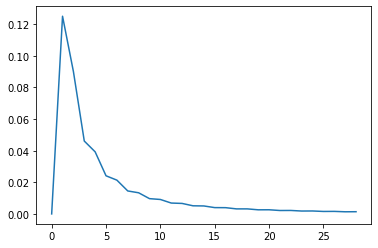

In [287]:
errors = []
for ui, uri in zip(u_mys, u_reals):
    print(np.abs(ui - uri))
    errors.append(np.abs(ui - uri).max())
    
plt.plot(errors)

In [15]:
# save files (if need so)
np.save('xes', xes)
np.save('yes', yes)
np.save('zes', zes)
np.save('real', u_real_array)
np.save('my', u_my)

#### try to make different plots

In [72]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

In [73]:

from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import numpy as np



In [94]:
z_un = np.unique(zes)
z_un

array([0.        , 0.03448276, 0.06896552, 0.10344828, 0.13793103,
       0.17241379, 0.20689655, 0.24137931, 0.27586207, 0.31034483,
       0.34482759, 0.37931034, 0.4137931 , 0.44827586, 0.48275862,
       0.51724138, 0.55172414, 0.5862069 , 0.62068966, 0.65517241,
       0.68965517, 0.72413793, 0.75862069, 0.79310345, 0.82758621,
       0.86206897, 0.89655172, 0.93103448, 0.96551724, 1.        ])

/Users/pigunther/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:30: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



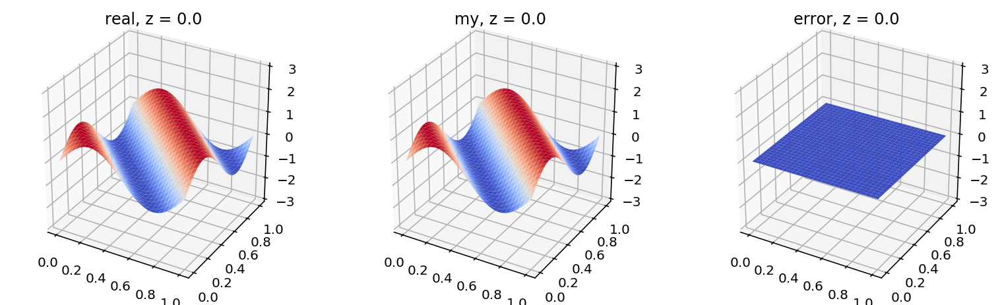

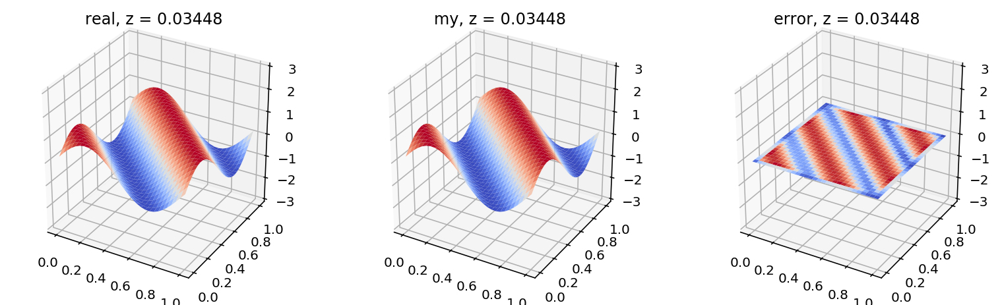

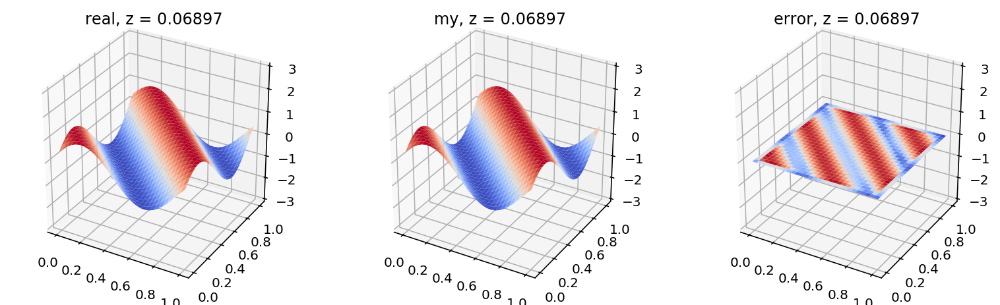

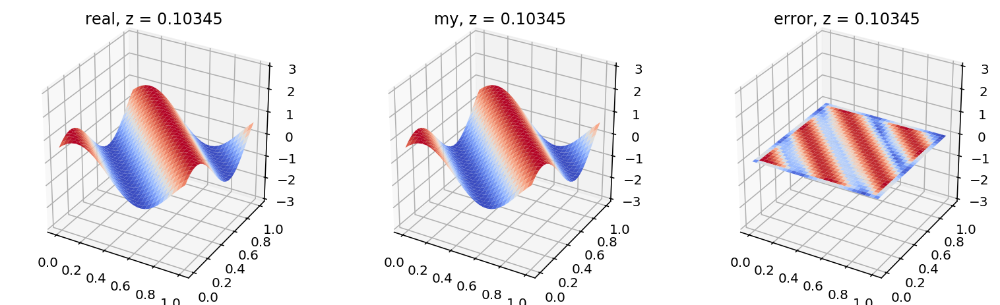

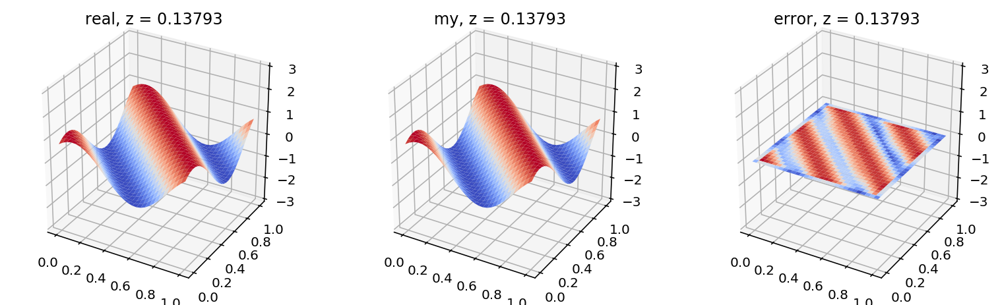

...

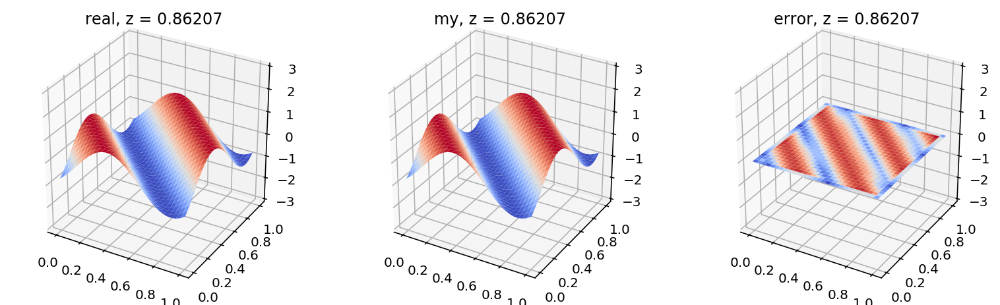

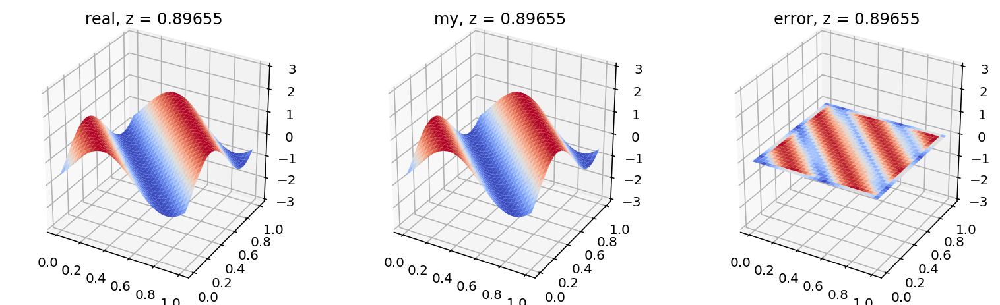

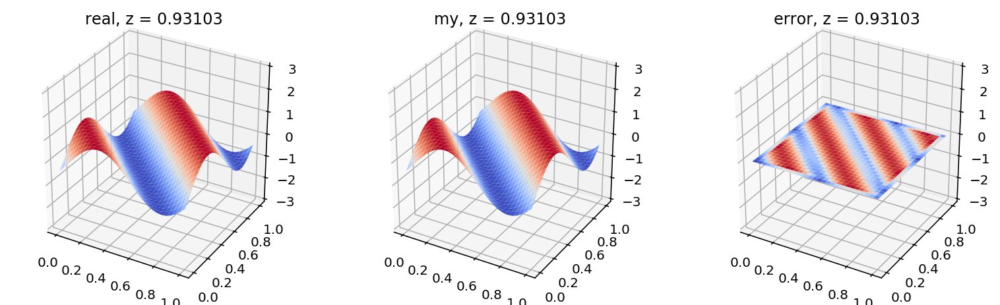

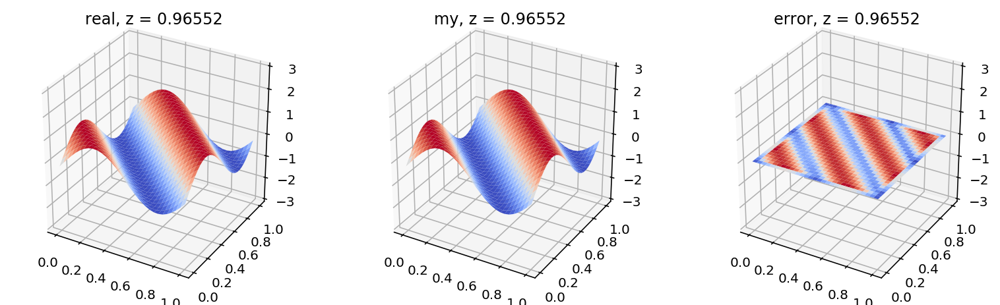

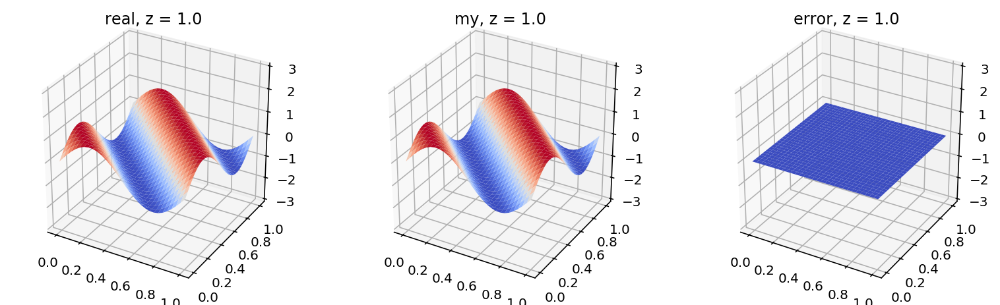

In [140]:
# library
!rm photos/my*.png


def points_with_fixed_z(z):
        ind = []
        for i in range(point_num):
            if np.abs(zes[i] - z) == 0:
                ind.append(i)
        return ind

for z in z_un:
    ind = points_with_fixed_z(z)
    X = xes[ind]
    Y = yes[ind]
    x_un = np.unique(X)
    y_un = np.unique(X)
    Z = np.zeros((x_un.size, y_un.size))
    Z2 = np.zeros((x_un.size, y_un.size))
    Z3 = np.zeros((x_un.size, y_un.size))
    for i in range(Z.shape[0]):
        for j in range(Z.shape[1]):
            arg = np.argwhere((X==x_un[i]) * (Y==y_un[j]))[0][0]
            Z[i][j] = u_real_array[ind[arg]]            
            Z2[i][j] = u_my[0][ind[arg]]
            Z3[i][j] = np.abs(Z[i][j]-Z2[i][j])
#     print(args)
# Make the plot

    fig = plt.figure(figsize=plt.figaspect(0.3))
#     ax = fig.gca(projection='3d')
    X, Y = np.meshgrid(x_un, y_un)
    ax = fig.add_subplot(1, 3, 1, projection='3d')
    ax2 = fig.add_subplot(1, 3, 2, projection='3d')
    ax3 = fig.add_subplot(1, 3, 3, projection='3d')
    surf = ax.plot_surface(X, Y, Z, cmap=plt.cm.coolwarm, linewidth=0, label='real')
#     surf.set_label('real')
    surf2 = ax2.plot_surface(X, Y, Z2, cmap=plt.cm.coolwarm, linewidth=0, label='my')
    surf3 = ax3.plot_surface(X, Y, Z3, cmap=plt.cm.coolwarm, linewidth=0, label='my')

    ax.set_zlim(-3, 3)
    ax2.set_zlim(-3, 3)
    ax3.set_zlim(-3, 3)
#     ax.set_xlabel('x')
#     ax.set_ylabel('y')
#     ax.text(0, -0.4, 4, 'real', None)
#     ax.text(0, -0.4, 9, 'my', None)
#     ax.text(0, -0.4, 14, 'error', None)

    filename='photos/my_'+str(z)+'.png'
    ax.set_title('real, ' + 'z = ' + str(z.round(5)))
    ax2.set_title('my, ' + 'z = ' + str(z.round(5)))
    ax3.set_title('error, ' + 'z = ' + str(z.round(5)))
#     plt.title('z = ' + str(z.round(5)))
    plt.savefig(filename, dpi=96)
    plt.gca()
    

In [141]:
!convert -delay 1 photos/my*.png gifs/animated_my.gif

In [34]:
import plotly.express as px
import pandas as pd
from plotly.graph_objs import *


In [310]:
data = {
    'x': xes,
    'y': yes,
    'z': zes,
    'real': u_real_array,
    'my': u_my[0],
    'error': u_my[0],
    'size': u_my[0]/10
#     'size': np.log(np.abs(u_my[0] - u_real_array)*5 + 1)+0.01*(np.abs(u_my[0] - u_real_array) == 0)
}
data = pd.DataFrame(data)

In [311]:
fig = px.scatter_3d(data,
                    x='x',
                    y='y',
                    z='z',
                    color='error',
                    size='size', template="plotly_white"
)
fig.show()

In [148]:
nmax = 30
all_xes = []
all_yes = []
all_zes = []
for i in range(1, nmax):
    mesh = meshio.read('mesh/cube{}.vtk'.format(i+1))

    points = mesh.points
    tetras = mesh.cells['tetra']

    point_num = len(points) 
    tetras_num = len(tetras)
    all_xes.append( points[:,0])
    all_yes.append( points[:,1])
    all_zes.append( points[:,2])

1
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
1


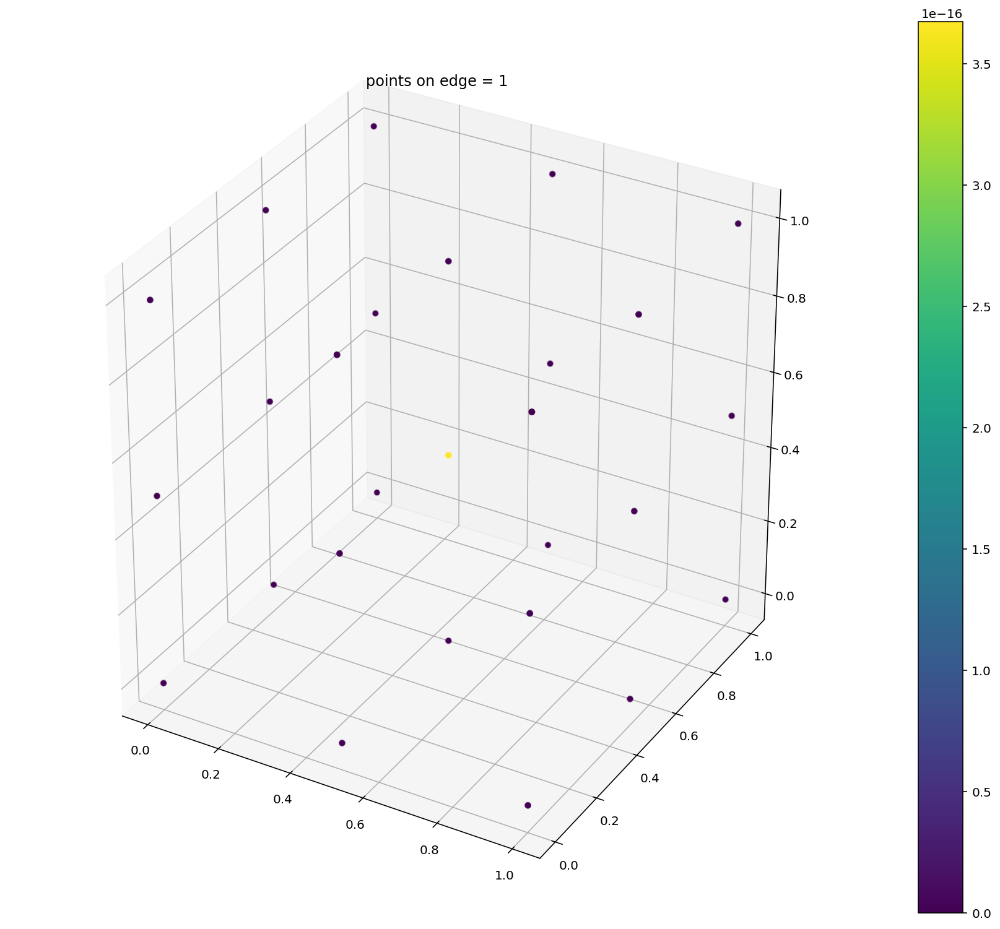

In [149]:

fig = plt.figure(figsize=(12,10))
ax = p3.Axes3D(fig)

err = np.abs(u_mys[0] - u_reals[0])
red = (err - err.min()) / (err.max() - err.min() + 0.001) * 256
dots = ax.scatter(all_xes[0], all_yes[0], all_zes[0], c=np.abs(u_mys[0] - u_reals[0])) 
# plt.axis('off')

ax.set_xlim3d([0, 1])
ax.set_ylim3d([0, 1])
ax.set_zlim3d([0, 1])

title = plt.title('')

def animate(i): 
    i+=1
    print(i)
    fig.clf()
    ax = p3.Axes3D(fig)
#     plt.axis('off')
    dots = ax.scatter(all_xes[i], all_yes[i], all_zes[i], c=np.abs(u_mys[i] - u_reals[i]))
#     dots.set_data(all_xes[i], all_yes[i])
#     dots.set_3d_properties(all_zes[i], c=np.abs(u_mys[i] - u_reals[i]))  
    
    plt.title("points on edge = {}".format(i))
#     title.set_text("i = {}".format(i)) 
    fig.colorbar(dots)


ani = animation.FuncAnimation(fig, animate, nmax-2, interval=3)
ani.save('gifs/cubes.gif', dpi=80, writer='imagemagick')
# plt.show()

In [159]:
%matplotlib notebook

In [162]:
np.save('files/xes', all_xes[i])
np.save('files/yes', all_yes[i])
np.save('files/zes', all_zes[i])
np.save('files/my', u_mys[i])
np.save('files/real', u_reals[i])
np.save('files/error', np.abs(u_mys[i] - u_reals[i]))


Text(0, 0.5, 'max(my - real)')

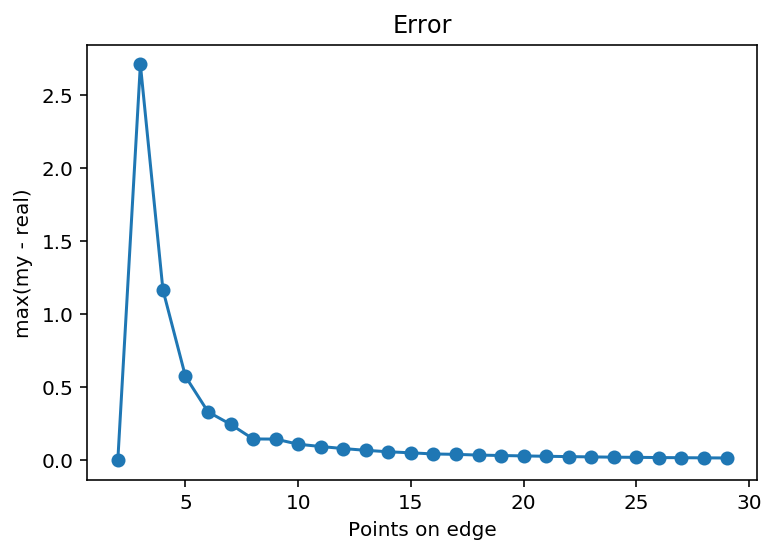

In [175]:
plt.plot(np.arange(2,30,1), errors[1:], 'o-')
plt.title('Error')
plt.xlabel('Points on edge')
plt.ylabel('max(my - real)')